In [2]:
import timm
import torch
from torchvision import transforms
from transformers import Swinv2Model, Swinv2Config, AutoImageProcessor
from PIL import Image

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import json

from concurrent.futures import ThreadPoolExecutor

/projectnb/herbdl/workspaces/mvoong/venvs/herb-cluster/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
import chart_studio.plotly as plt
import plotly.graph_objs as pgo
import plotly.express as px

import numpy as np
import pandas as pd
from tqdm import tqdm

In [24]:
# requirements
#! pip install transformers
#! pip install scikit-learn
#! pip install matplotlib
#! pip install plotly
#! pip install chart-studio

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [5]:
# load swin 
model_name = 'microsoft/swinv2-base-patch4-window12-192-22k'  

# checkpoint for entire kaggle dataset:
# '/projectnb/herbdl/workspaces/faridkar/herbdl/finetuning/output/SWIN/checkpoint-70-epochs'

# astera family checkpoint with 86% accuracy
checkpoint_path = '/projectnb/herbdl/workspaces/faridkar/herbdl/finetuning/output/SWIN/kaggle22_astera_50'
model = Swinv2Model.from_pretrained(checkpoint_path, output_hidden_states=True)
model.to(device)
model.eval()

Swinv2Model(
  (embeddings): Swinv2Embeddings(
    (patch_embeddings): Swinv2PatchEmbeddings(
      (projection): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
    )
    (norm): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    (dropout): Dropout(p=0.0, inplace=False)
  )
  (encoder): Swinv2Encoder(
    (layers): ModuleList(
      (0): Swinv2Stage(
        (blocks): ModuleList(
          (0-1): 2 x Swinv2Layer(
            (attention): Swinv2Attention(
              (self): Swinv2SelfAttention(
                (continuous_position_bias_mlp): Sequential(
                  (0): Linear(in_features=2, out_features=512, bias=True)
                  (1): ReLU(inplace=True)
                  (2): Linear(in_features=512, out_features=4, bias=False)
                )
                (query): Linear(in_features=128, out_features=128, bias=True)
                (key): Linear(in_features=128, out_features=128, bias=False)
                (value): Linear(in_features=128, out_features=12

In [6]:
# preprocess an image
def preprocess_image(image_path):
    image = Image.open(image_path)
    inputs = processor(images=image, return_tensors="pt").to(device)  # return pytorch tensor
    return inputs

# batch preprocess image
def batch_parallel_preprocess(image_paths, batch_size=32, max_workers=8):
    inputs = []
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        # wrap the main loop with tqdm for progress tracking
        for i in tqdm(range(0, len(image_paths), batch_size), desc="Processing Batches"):
            batch_paths = image_paths[i:i+batch_size]
            # process each batch in parallel
            batch_results = list(executor.map(preprocess_image, batch_paths))
            inputs.extend(batch_results)
    return inputs

In [7]:
# get feature vector from model outputs
def extract_features(inputs):
    with torch.no_grad():
        outputs = model(**inputs)
        feature_vector = outputs.last_hidden_state.mean(dim=1).to(device)#.squeeze()
    return feature_vector

def batch_extract_features(image_inputs, batch_size=32, max_workers=8):
    inputs = []
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        # wrap the main loop with tqdm for progress tracking
        for i in tqdm(range(0, len(image_inputs), batch_size), desc="Processing Batches"):
            batch_paths = image_inputs[i:i+batch_size]
            batch_results = list(executor.map(extract_features, batch_paths))
            inputs.extend(batch_results)
    return inputs

In [8]:
def get_image_paths(file_paths):
    # return dictionary with image paths and image captions 
    
    path_dict = {}
    # open the file and read each line as a JSON object
    with open(file_paths, 'r') as f:
        for line in f:
            # Parse each line as a JSON object
            obj = json.loads(line.strip())
            path_dict[obj['image']] = obj['caption']
    return path_dict 

# get image paths 
val_img_paths = '/projectnb/herbdl/workspaces/faridkar/herbdl/finetuning/datasets/val_astera.json'
val_kaggle22 = get_image_paths(val_img_paths)

In [9]:
# load the processor for image preprocessing
processor = AutoImageProcessor.from_pretrained(model_name)

In [10]:
val_paths = list(val_kaggle22.keys())

In [11]:
val_preprocess_images = batch_parallel_preprocess(val_paths)

Processing Batches: 100%|██████████| 431/431 [00:35<00:00, 12.27it/s]


In [12]:
val_features_list = batch_extract_features(val_preprocess_images)

Processing Batches: 100%|██████████| 431/431 [04:54<00:00,  1.46it/s]


In [17]:
# stack features into a matrix
features_matrix = torch.stack(val_features_list).cpu().numpy()

In [14]:
features_matrix.shape

(13766, 1, 1024)

In [20]:
# apply pca
pca_2d = PCA(n_components=2)
features_2d = pca_2d.fit_transform(features_matrix.squeeze())

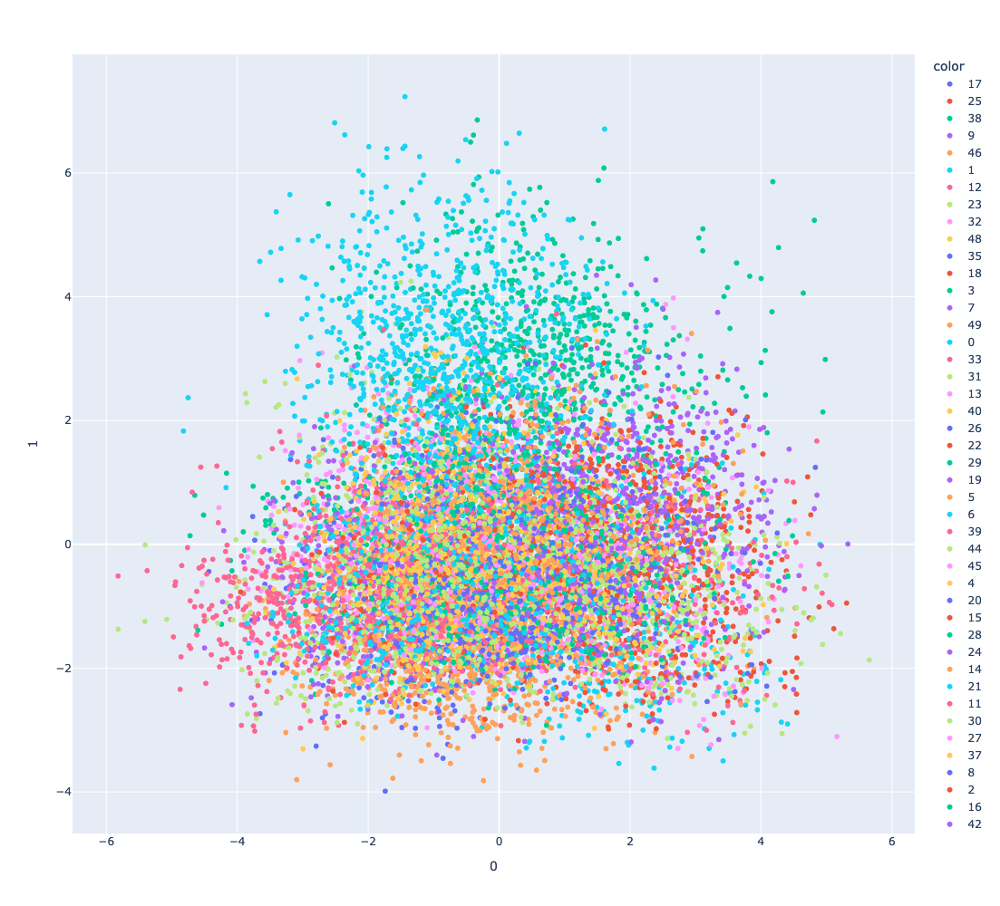

In [29]:
# change the colors to be discrete
fig = px.scatter(features_2d, 
                 width=1000,
                 height=1000,
                 x=0, 
                 y=1, 
                 color=df_X_reduced['label'])
fig.show()

In [22]:
# build dataframe 
df_X_reduced = pd.DataFrame(features_2d, index=val_paths)#, index=df.index)
df_X_reduced['label'] = list(val_kaggle22.values())
df_X_reduced.head()

,0,1,label
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/142/59/14259__031.jpg,-0.990337,-1.139601,17
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/086/78/08678__096.jpg,4.540444,-2.150120,25
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/146/49/14649__053.jpg,0.707043,2.736033,38
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/088/23/08823__014.jpg,-2.014076,0.863456,9
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/041/15/04115__056.jpg,0.385368,1.781902,38


In [23]:
# change label to string for plotting purposes
df_X_reduced['label'] = df_X_reduced['label'].astype(str)

In [24]:
# build dictionary where key is image path and caption is the string name
caption_train = {}
caption_val = {}
train_json = '/projectnb/herbdl/workspaces/faridkar/herbdl/finetuning/datasets/val_22_scientific_str.json'
val_json = '/projectnb/herbdl/workspaces/faridkar/herbdl/finetuning/datasets/train_22_scientific_str.json'

# open the file and read each line as a JSON object
with open(train_json, 'r') as f:
    for line in f:
        # Parse each line as a JSON object
        obj = json.loads(line.strip())
        caption_train[obj['image']] = obj['caption']

with open(val_json, 'r') as f:
    for line in f:
        # Parse each line as a JSON object
        obj = json.loads(line.strip())
        caption_val[obj['image']] = obj['caption']

In [25]:
# add another column for str label 
captions = []

# using image path find the corrresponding caption 
for row in df_X_reduced.iterrows():
    im_path = row[0]
    try:
        captions.append(caption_train[im_path])
    except KeyError:
        captions.append(caption_val[im_path])

In [30]:
# dimensionality reduction using tsne 
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(features_matrix.squeeze())

In [38]:
df_X_tsne = pd.DataFrame(X_tsne, index=val_paths)

In [39]:
df_X_tsne.head()

,0,1
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/142/59/14259__031.jpg,12.308444,-50.668556
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/086/78/08678__096.jpg,65.318893,-3.129252
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/146/49/14649__053.jpg,-19.094051,94.322327
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/088/23/08823__014.jpg,-41.465153,-34.785599
/projectnb/herbdl/data/kaggle-herbaria/herbarium-2022/train_images/041/15/04115__056.jpg,-12.237421,96.010414


In [31]:
color_mapping = {
    "1": "#FF0000",  "2": "#00FF00",  "3": "#0000FF",  "4": "#FFFF00",  "5": "#FF00FF",
    "6": "#00FFFF",  "7": "#800000",  "8": "#008000",  "9": "#000080", "10": "#808000",
    "11": "#800080", "12": "#008080", "13": "#C00000", "14": "#00C000", "15": "#0000C0",
    "16": "#FFC0CB", "17": "#FFD700", "18": "#4B0082", "19": "#FF4500", "20": "#2E8B57",
    "21": "#FF6347", "22": "#4682B4", "23": "#DAA520", "24": "#7FFF00", "25": "#6495ED",
    "26": "#DC143C", "27": "#20B2AA", "28": "#FF1493", "29": "#B22222", "30": "#32CD32",
    "31": "#6A5ACD", "32": "#FF69B4", "33": "#ADFF2F", "34": "#00CED1", "35": "#FF8C00",
    "36": "#8A2BE2", "37": "#00FA9A", "38": "#FFB6C1", "39": "#8B0000", "40": "#556B2F",
    "41": "#B0C4DE", "42": "#FF7F50", "43": "#7CFC00", "44": "#9400D3", "45": "#F4A460",
    "46": "#4682B4", "47": "#D2691E", "48": "#DA70D6", "49": "#87CEFA", "50": "#FFDEAD"
}

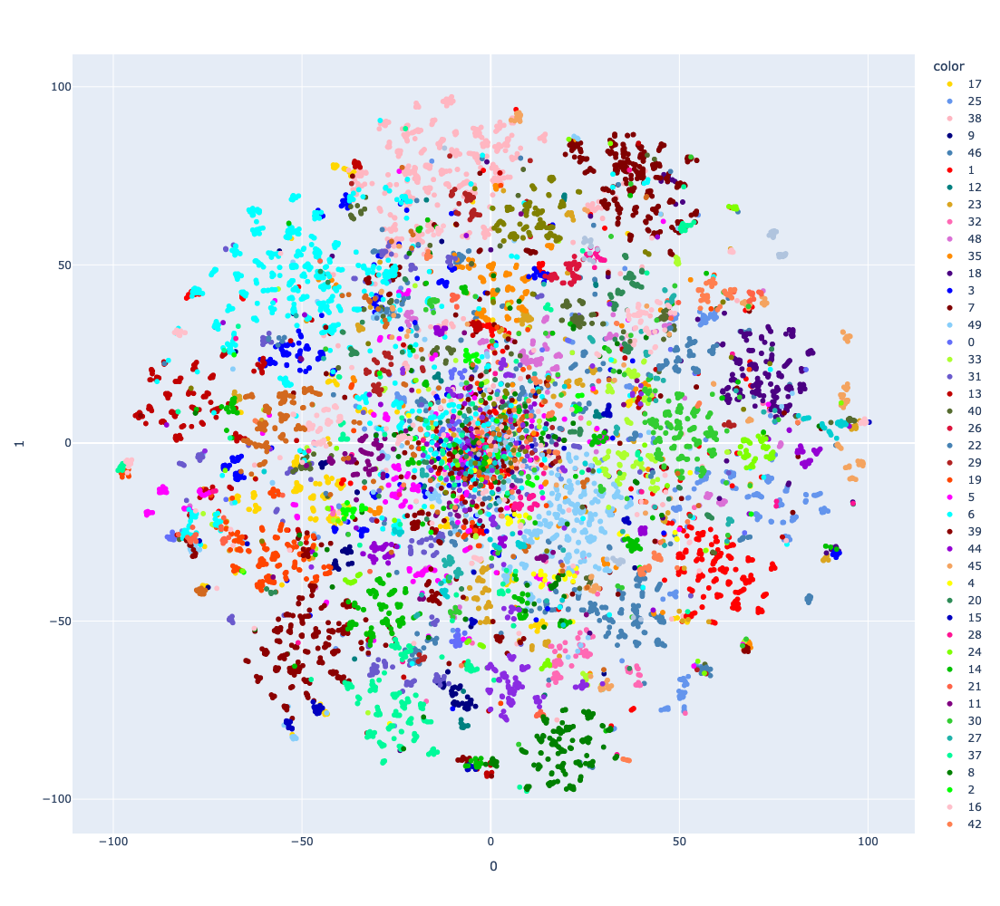

In [36]:
fig_tsne = px.scatter(X_tsne, 
                      width=1000,
                      height=1000,
                      x=0, 
                      y=1,
                      color=df_X_reduced['label'],
                      hover_data=[df_X_reduced['caption']],
                      color_discrete_map=color_mapping)
                      #color_discrete_sequence=px.colors.qualitative.Light24)
fig_tsne.show()